# SSA-brainstem

Reproduction of **Maccarone et al., MICCAI 2025** using geomfum.

Pipeline:
1. Load remeshed (LR) + original (HR) brainstem meshes and basis matrices.
2. Build a connectivity graph; compute initial pairwise FMs via KNN.
3. Consistent ZoomOut / Limit Shape network refinement (`FunctionalMapNetwork`).
4. Template selection, LR and HR displacement computation, PCA.
5. Classification (Logistic Regression, SVM, Random Forest).

In [1]:
import copy
import os
import random
import sys
import time

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import plotly.graph_objects as go
import scipy
import scipy.io
import scipy.linalg
from scipy.spatial.transform import Rotation
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

sys.path.insert(0, r"d:\\geomfum")
from geomfum.convert import NeighborFinder
from geomfum.network import FunctionalMapNetwork
from geomfum.shape import TriangleMesh

In [2]:

SPECTRUM_SIZE  = 110   # eigenpairs per LR mesh
K_INIT         = 20    # initial FM spectral dimension
N_PAIRS        = 250   # edges in correspondence graph
K_DISPLACEMENT = 100   # eigenbasis truncation for displacement

from geomfum.dataset.notebook import BrainstemDataset

dataset    = BrainstemDataset(load_at_startup=True)
keys       = list(dataset.files.keys())
all_labels = dataset.get_labels(keys)   # aligned with keys

train_keys, test_keys, train_labels, test_labels = train_test_split(
    keys, all_labels, test_size=0.15, random_state=42, shuffle=True, stratify=all_labels
)

train_list = [TriangleMesh.from_file(dataset.get_filename(k)) for k in train_keys]

graph = FunctionalMapNetwork(train_list)
graph.add_fully_connected_random_edges(N_PAIRS, seed=0)
graph.low_resolution(min_n_samples=3000)

# Recenter and normalize each LR mesh to unit surface area
for hm in graph.shapes:
    v = hm.low.vertices
    v -= v.mean(0)                                                     # recenter
    v /= np.sqrt(float(np.asarray(hm.low.face_areas).sum()))          # unit surface area
    hm.low._face_areas = None                                          # invalidate cache

N_meshes = len(train_list)
print(f"Train: {len(train_keys)} — 0: {(train_labels == 0).sum()}, 1: {(train_labels == 1).sum()}")
print(f"Test:  {len(test_keys)}  — 0: {(test_labels  == 0).sum()}, 1: {(test_labels  == 1).sum()}")


100%|██████████| 102/102 [06:01<00:00,  3.54s/it]

Train: 102 — 0: 74, 1: 28
Test:  18  — 0: 13, 1: 5


In [3]:

# ── Helper functions ────────────────────────────────────────────────────────

def knn_query(X, Y, n_neighbors=1):
    """For each row in X, returns the index of the nearest row in Y."""
    finder = NeighborFinder(n_neighbors=n_neighbors)
    return finder(X, Y).flatten()


def compute_first_pca_vector(vertices):
    pca = PCA(n_components=3)
    pca.fit(vertices)
    return pca.components_[0]


def align_mesh(verts1, verts2):
    """Return rotation R (3x3) that best aligns PCA axis of verts1 with verts2."""
    v1 = compute_first_pca_vector(verts1)
    v2 = compute_first_pca_vector(verts2)
    v1 = v1 / np.linalg.norm(v1)
    v2 = v2 / np.linalg.norm(v2)
    axis = np.cross(v1, v2)
    norm = np.linalg.norm(axis)
    if norm < 1e-6:
        return np.eye(3)
    axis /= norm
    angle = np.arccos(np.clip(np.dot(v1, v2), -1, 1))
    return Rotation.from_rotvec(angle * axis).as_matrix()


def rigid_alignment(verts_tgt, verts_src, p2p, weights=None):
    """Weighted Procrustes: find R, t such that (verts_src[p2p] - t) @ R ~ verts_tgt.
    Apply to a mesh via: verts_aligned = (verts_src - t) @ R.
    """
    pts_src = verts_src[p2p]
    pts_tgt = verts_tgt
    n = len(pts_tgt)
    w = np.ones(n) / n if weights is None else np.asarray(weights, float)
    w = w / w.sum()
    c_src = (w[:, None] * pts_src).sum(0)
    c_tgt = (w[:, None] * pts_tgt).sum(0)
    H = ((w[:, None] * (pts_src - c_src)).T) @ (pts_tgt - c_tgt)
    U, _, Vt = np.linalg.svd(H)
    d = np.linalg.det(Vt.T @ U.T)
    R = U @ np.diag([1.0, 1.0, d]) @ Vt
    t = c_src - c_tgt @ R.T
    return R, t


def vertex_areas(mesh):
    """Per-vertex areas (1/3 of adjacent face areas)."""
    return np.asarray(mesh.vertex_areas).flatten()


def spectral_project(mesh, f, k):
    """Project vertex function f (n,3) onto k eigenbasis vectors -> (k,3).

    Uses mass-weighted inner product: vecs[:,:k].T @ mass_matrix @ f.
    """
    return np.asarray(mesh.basis.truncate(k).project(np.asarray(f, float).T)).T


def spectral_decode(mesh, tau, k):
    """Reconstruct from spectral coefficients tau (k,3) -> (n,3)."""
    return np.asarray(mesh.basis.truncate(k).vecs) @ tau


def chamfer_distance(pts_a, pts_b):
    """One-directional chamfer: mean NN distance from pts_a to pts_b."""
    idx = knn_query(pts_a, pts_b)
    return float(np.linalg.norm(pts_b[idx] - pts_a, axis=1).mean())


def generate_fully_connected_graph(n, m, seed=42):
    """Spanning-tree backbone + random extra edges -> connected graph with m edges."""
    random.seed(seed)
    G = nx.random_tree(n, seed=seed)
    existing = set(G.edges())
    available = [(i, j) for i in range(n) for j in range(i + 1, n)
                 if (i, j) not in existing and (j, i) not in existing]
    extra = random.sample(available, m - len(existing))
    G.add_edges_from(extra)
    return G


def absolute_eigenfunction(mesh_list):
    """Align eigenfunction signs across meshes using a stable landmark."""
    def _landmark(mesh):
        pca_dir = compute_first_pca_vector(mesh.low.basis.full_vecs[:, 1:4])
        proj = mesh.low.vertices @ pca_dir
        return int(np.argmax(proj))

    ref_sign = np.sign(mesh_list[0].low.basis.full_vecs[_landmark(mesh_list[0]), 0])
    for mesh in mesh_list[1:]:
        sign = np.sign(mesh.low.basis.full_vecs[_landmark(mesh), 0])
        if sign != ref_sign:
            mesh.low.basis.full_vecs[:] = -mesh.low.basis.full_vecs


def evec_rgb(mesh, k=3):
    """Color vertices by the first k eigenvectors mapped to RGB.

    Eigenvectors encode intrinsic geometry and are invariant to rigid motion,
    so corresponding vertices on well-matched shapes share the same color.
    """
    evecs = mesh.basis.full_vecs[:, :k]   # (n, k)
    lo, hi = evecs.min(0), evecs.max(0)
    rng = np.where(hi - lo > 0, hi - lo, 1.0)
    return ((evecs - lo) / rng * 255).astype(int)   # (n, 3) in [0, 255]


def create_colormap(scalar):
    """Map scalar array (n,) to RGB colours in [0,1]."""
    s = np.asarray(scalar, float).flatten()
    lo, hi = s.min(), s.max()
    if hi == lo:
        return np.ones((len(s), 3)) * 0.5
    t = (s - lo) / (hi - lo)
    return np.stack([t, np.zeros_like(t), 1 - t], axis=1)


def plot_mesh(verts, faces, scalar=None, title="Mesh"):
    x, y, z = verts[:, 0], verts[:, 1], verts[:, 2]
    i, j, k = faces[:, 0], faces[:, 1], faces[:, 2]
    colors = (create_colormap(scalar) * 255).astype(int).tolist() if scalar is not None else None
    fig = go.Figure(go.Mesh3d(
        x=x, y=y, z=z, i=i, j=j, k=k,
        vertexcolor=colors,
        color="lightblue" if colors is None else None,
        opacity=1,
    ))
    fig.update_layout(title=title, scene=dict(aspectmode="data"))
    fig.show()


In [4]:

mesh = graph.shapes[0].low
plot_mesh(mesh.vertices, mesh.faces, title=f"Shape 0 — {train_keys[0]}")


### Compute Laplacian Spectrum

In [5]:
graph.compute_spectrum(SPECTRUM_SIZE)

100%|██████████| 102/102 [01:21<00:00,  1.25it/s]


### Build Correspondence Graph

In [6]:
absolute_eigenfunction(graph.shapes)

### Compute Initial Functional Maps (KNN)

In [7]:
from geomfum.network import _fm_from_p2p

fm_dict = {}

t0 = time.time()
for pair_ind, (i, j) in enumerate(graph.edges):
    mesh_i = graph.shapes[i].low  # HierarchicalMesh
    mesh_j = graph.shapes[j].low

    # Rotate mesh_i to align PCA axis with mesh_j
    R_align = align_mesh(mesh_i.vertices, mesh_j.vertices)
    verts_i_rot = mesh_i.vertices @ R_align.T

    basis_i = mesh_i.basis.truncate(K_INIT)
    basis_j = mesh_j.basis.truncate(K_INIT)

    # p2p: for each mesh_j vertex, nearest rotated mesh_i vertex -> FM j<-i
    p2p_ji = knn_query(mesh_j.vertices, verts_i_rot)
    fm_dict[(i, j)] = _fm_from_p2p(p2p_ji, basis_i, basis_j)

    # reverse direction: FM i<-j
    p2p_ij = knn_query(verts_i_rot, mesh_j.vertices)
    fm_dict[(j, i)] = _fm_from_p2p(p2p_ij, basis_j, basis_i)

    if pair_ind % 10 == 0:
        print(f"  {pair_ind}/{graph.n_edges} pairs done", end="\r")

print(f"\n{len(fm_dict)} FMs computed in {time.time()-t0:.1f}s")

  240/250 pairs done
494 FMs computed in 5.0s


In [8]:

from plotly.subplots import make_subplots

# ── pick any edge to inspect ──────────────────────────────────────────────
edge_idx = 0
i, j = graph.edges[edge_idx]
mesh_i = graph.shapes[i].low
mesh_j = graph.shapes[j].low

# recompute p2p for this edge (same logic as the loop above)
R_align     = align_mesh(mesh_i.vertices, mesh_j.vertices)
verts_i_rot = mesh_i.vertices @ R_align.T
p2p_ji      = knn_query(mesh_j.vertices, verts_i_rot)   # (n_j,) → indices into i

# Eigenvector colormap on mesh_i, then transfer via p2p to mesh_j
colors_i = evec_rgb(mesh_i)           # (n_i, 3) int array
colors_j = colors_i[p2p_ji]           # (n_j, 3) transferred

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{"type": "mesh3d"}, {"type": "mesh3d"}]],
    subplot_titles=[f"Shape {i} (source)", f"Shape {j} (p2p from {i})"],
)
for col, (verts, faces, cols) in enumerate([
    (mesh_i.vertices, mesh_i.faces, colors_i),
    (mesh_j.vertices, mesh_j.faces, colors_j),
], start=1):
    x, y, z = verts[:, 0], verts[:, 1], verts[:, 2]
    fi, fj, fk = faces[:, 0], faces[:, 1], faces[:, 2]
    hex_colors = [f"#{r:02x}{g:02x}{b:02x}" for r, g, b in cols]
    fig.add_trace(
        go.Mesh3d(x=x, y=y, z=z, i=fi, j=fj, k=fk,
                  vertexcolor=hex_colors, opacity=1),
        row=1, col=col,
    )

fig.update_layout(
    height=520,
    title_text=f"Initial KNN p2p — edge ({i}, {j})",
    scene=dict(aspectmode="data"),
    scene2=dict(aspectmode="data"),
)
fig.show()


### Consistent ZoomOut (Functional Map Network)

Populate `graph.conn` with the pairwise FMs, then jointly refine with
Consistent ZoomOut / Limit Shape.

In [9]:
for (i, j), fmap in fm_dict.items():
    graph.add_edge(i, j, fmap)

print("Initial spectral dimension M:", graph.M)

Initial spectral dimension M: 20


In [10]:
steps = 1
czo_params = dict(
    nit         = (60 - K_INIT) // steps,
    step        = steps,
    cclb_ratio  = 0.8,
    subsample   = None,       # full vertex set (KNN path)
    isometric   = False,
    weight_type = "icsm",
    verbose     = True,
)
graph.zoomout_refine(**czo_params)
print("Refined M:", graph.M)

Computing cycle information
Optimizing cycle weights...
Computing 20 CLB eigenvectors...
Optimizing cycle weights...
Computing 21 CLB eigenvectors...
Optimizing cycle weights...
Computing 22 CLB eigenvectors...
Optimizing cycle weights...
Computing 23 CLB eigenvectors...
Optimizing cycle weights...
Computing 24 CLB eigenvectors...
Optimizing cycle weights...
Computing 25 CLB eigenvectors...
Optimizing cycle weights...
Computing 26 CLB eigenvectors...
Optimizing cycle weights...
Computing 27 CLB eigenvectors...
Optimizing cycle weights...
Computing 28 CLB eigenvectors...
Optimizing cycle weights...
Computing 29 CLB eigenvectors...
Optimizing cycle weights...
Computing 30 CLB eigenvectors...
Optimizing cycle weights...
Computing 31 CLB eigenvectors...
Optimizing cycle weights...
Computing 32 CLB eigenvectors...
Optimizing cycle weights...
Computing 33 CLB eigenvectors...
Optimizing cycle weights...
Computing 34 CLB eigenvectors...
Optimizing cycle weights...
Computing 35 CLB eigenvectors

In [11]:
graph.compute_W(M=50)
graph.compute_CCLB(m=int(0.8 * graph.M), verbose=True)
graph.compute_p2p(complete=True)

edge = graph.edges[0]
print(f"p2p for edge {edge} (first 10):", graph.p2p[edge][:10])

Computing 50 CLB eigenvectors...
p2p for edge (0, 80) (first 10): [64 64 62 43 23 43 62 88 70 64]


In [12]:

# ── visualise p2p after Consistent ZoomOut ───────────────────────────────
edge_idx = 0
i, j = graph.edges[edge_idx]
mesh_i = graph.shapes[i].low
mesh_j = graph.shapes[j].low

p2p_ji = graph.p2p[(i, j)]          # (n_j,) → indices into i, from graph.compute_p2p

colors_i = evec_rgb(mesh_i)          # (n_i, 3) int array
colors_j = colors_i[p2p_ji]          # (n_j, 3) transferred

fig = make_subplots(
    rows=1, cols=2,
    specs=[[{"type": "mesh3d"}, {"type": "mesh3d"}]],
    subplot_titles=[f"Shape {i} (source)", f"Shape {j} (p2p after CZO)"],
)
for col, (verts, faces, cols) in enumerate([
    (mesh_i.vertices, mesh_i.faces, colors_i),
    (mesh_j.vertices, mesh_j.faces, colors_j),
], start=1):
    x, y, z = verts[:, 0], verts[:, 1], verts[:, 2]
    fi, fj, fk = faces[:, 0], faces[:, 1], faces[:, 2]
    hex_colors = [f"#{r:02x}{g:02x}{b:02x}" for r, g, b in cols]
    fig.add_trace(
        go.Mesh3d(x=x, y=y, z=z, i=fi, j=fj, k=fk,
                  vertexcolor=hex_colors, opacity=1),
        row=1, col=col,
    )

fig.update_layout(
    height=520,
    title_text=f"Refined KNN p2p (post-CZO) — edge ({i}, {j})",
    scene=dict(aspectmode="data"),
    scene2=dict(aspectmode="data"),
)
fig.show()


### Template Selection

In [13]:
deviation_a  = np.zeros(graph.n_shapes)
deviation_cr = np.zeros(graph.n_shapes)

for i in range(graph.n_shapes):
    CSD_a, CSD_c = graph.get_CSD(i)
    m = CSD_a.shape[0]
    deviation_a[i]  = np.linalg.norm(CSD_a - np.eye(m))
    evals = np.maximum(graph.cclb_eigenvalues, 0)   # clip numerical negatives
    deviation_cr[i] = (np.linalg.norm(np.sqrt(evals[:, None]) *
                                       (CSD_c - np.eye(m))) /
                       np.sqrt(evals.sum() + 1e-12))

base_meshind = int(deviation_cr.argmin())
print(f"Template: mesh index {base_meshind}")

# Rotate all LR meshes to align with template
for i, mesh in enumerate(graph.shapes):
    if i == base_meshind:
        continue
    R_align = align_mesh(mesh.low.vertices, graph.shapes[base_meshind].low.vertices)
    mesh.low.vertices[:] = mesh.low.vertices @ R_align.T


Template: mesh index 56


### Low-Resolution Displacements

In [14]:
mesh_tmpl = graph.shapes[base_meshind].low
LB_tmpl   = graph.get_LB(base_meshind, complete=True)   # (n_lr_tmpl, m)

displacements_lr_red = np.zeros((graph.n_shapes, 3 * K_DISPLACEMENT))
displacements_lr     = np.zeros((graph.n_shapes, 3 * mesh_tmpl.n_vertices))
p2p_lr_list = [None] * graph.n_shapes

for meshind in range(graph.n_shapes):
    if meshind == base_meshind:
        continue
    mesh2 = copy.deepcopy(graph.shapes[meshind].low)
    LB_2  = graph.get_LB(meshind, complete=True)

    # KNN in latent basis space
    p2p_12 = knn_query(LB_tmpl.astype(np.float32), LB_2.astype(np.float32))
    p2p_lr_list[meshind] = p2p_12

    # Rigid ICP alignment
    w = vertex_areas(mesh_tmpl)
    R_icp, t = rigid_alignment(mesh_tmpl.vertices, mesh2.vertices, p2p_12, weights=w)
    verts2_aligned = (mesh2.vertices - t) @ R_icp

    disp_xyz = verts2_aligned[p2p_12] - mesh_tmpl.vertices
    tau = spectral_project(mesh_tmpl, disp_xyz, K_DISPLACEMENT)
    displacements_lr[meshind]     = spectral_decode(mesh_tmpl, tau, K_DISPLACEMENT).flatten()
    displacements_lr_red[meshind] = tau.flatten()

    if meshind % 10 == 0:
        print(f"  {meshind}/{graph.n_shapes-1}", end="\r")

print("\nDone")

  100/101
Done


In [15]:
chamfer_list = []
for meshind in range(graph.n_shapes):
    if meshind == base_meshind or p2p_lr_list[meshind] is None:
        continue
    verts_mapped = graph.shapes[meshind].low.vertices[p2p_lr_list[meshind]]
    chamfer_list.append(chamfer_distance(mesh_tmpl.vertices, verts_mapped))

print(f"Mean Chamfer (LR): {np.mean(chamfer_list):.5f}")

Mean Chamfer (LR): 0.02033


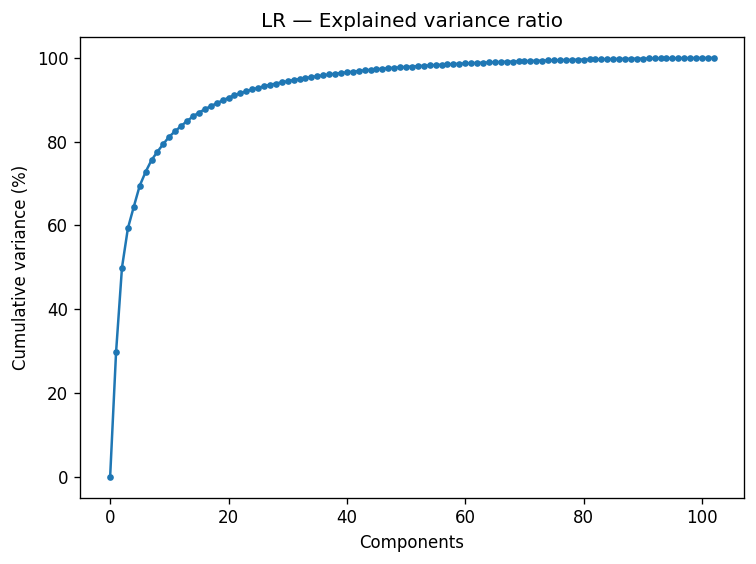

In [16]:
avg_lr = displacements_lr_red.mean(0)
pca_lr = PCA(n_components=min(graph.n_shapes, 3 * K_DISPLACEMENT))
emb_lr = pca_lr.fit_transform(displacements_lr_red - avg_lr[None, :])

plt.figure(dpi=120)
plt.title("LR — Explained variance ratio")
plt.xlabel("Components"); plt.ylabel("Cumulative variance (%)")
plt.plot(100 * np.cumsum(np.concatenate([[0], pca_lr.explained_variance_ratio_])), marker=".")
plt.tight_layout(); plt.show()

### High-Resolution Displacements

In [17]:

from geomfum.shape.hierarchical import HierarchicalMesh
from tqdm.auto import tqdm


def _normalize(mesh):
    """Recenter and scale to unit surface area in-place."""
    v = mesh.vertices
    v -= v.mean(0)
    v /= np.sqrt(float(np.asarray(mesh.face_areas).sum()))
    mesh._face_areas = None   # invalidate cache after in-place scaling


def _lr_to_hr(hm, lr_data):
    """Transfer (n_lr, k) data to (n_hr, k) using PyRMT barycentric map.

    scalar_low_high expects (..., n_lr); eigenvectors/LB are (n_lr, k),
    so we transpose before and after.
    """
    return np.asarray(hm.scalar_low_high(np.asarray(lr_data, float).T)).T


# ── Train HR: normalize in-place (LR already normalized in c02) ──────────
for hm in tqdm(graph.shapes, desc="normalize train HR"):
    _normalize(hm.high)

# ── Test: load → LR → normalize both → spectrum ─────────────────────────
test_hm_list = [
    HierarchicalMesh.from_registry(
        TriangleMesh.from_file(dataset.get_filename(k)), min_n_samples=3000
    )
    for k in tqdm(test_keys, desc="test LR")
]

for hm in test_hm_list:
    _normalize(hm.low)
    _normalize(hm.high)

for hm in tqdm(test_hm_list, desc="test spectrum"):
    hm.low.laplacian.find_spectrum(spectrum_size=SPECTRUM_SIZE, set_as_basis=True)

test_hr_list = [hm.high for hm in test_hm_list]
print(f"Train HR: {graph.n_shapes} | Test: {len(test_hm_list)}")


normalize train HR:   0%|          | 0/102 [00:00<?, ?it/s]

test LR:   0%|          | 0/18 [00:00<?, ?it/s]

test spectrum:   0%|          | 0/18 [00:00<?, ?it/s]

Train HR: 102 | Test: 18


In [ ]:
# ── Template HR ──────────────────────────────────────────────────────────
tmpl_hm      = graph.shapes[base_meshind]
mesh_tmpl_hr = tmpl_hm.high
mesh_tmpl_lr = tmpl_hm.low

evecs_tmpl_hr = _lr_to_hr(tmpl_hm, mesh_tmpl_lr.basis.full_vecs)   # (n_hr, k)
LB_tmpl_hr    = _lr_to_hr(tmpl_hm, LB_tmpl)                         # (n_hr, m)

pinv_evecs = np.linalg.pinv(evecs_tmpl_hr[:, :K_DISPLACEMENT])

# ── Rotate train HR meshes to template orientation ───────────────────────
for i, hm in enumerate(graph.shapes):
    if i == base_meshind:
        continue
    R = align_mesh(hm.high.vertices, mesh_tmpl_hr.vertices)
    hm.high.vertices[:] = hm.high.vertices @ R.T

# ── Compute HR displacements ─────────────────────────────────────────────
# Features: upsample the LR spectral reconstruction (from c19) to HR via
# scalar_low_high, then project with pinv_evecs.  This uses the exact LR
# eigenbasis quality and only delegates the HR upsampling to PyRMT.
displacements_hr_red = np.zeros((graph.n_shapes, 3 * K_DISPLACEMENT))
displacements_hr     = np.zeros((graph.n_shapes, 3 * mesh_tmpl_hr.n_vertices))
p2p_hr_list = [None] * graph.n_shapes

for meshind in range(graph.n_shapes):
    if meshind == base_meshind:
        continue
    hm2     = graph.shapes[meshind]
    hr2     = copy.deepcopy(hm2.high)
    LB_2_hr = _lr_to_hr(hm2, graph.get_LB(meshind, complete=True))

    p2p_12 = knn_query(LB_tmpl_hr.astype(np.float32), LB_2_hr.astype(np.float32))
    p2p_hr_list[meshind] = p2p_12

    w = np.ones(mesh_tmpl_hr.n_vertices) / mesh_tmpl_hr.n_vertices
    R_icp, t = rigid_alignment(mesh_tmpl_hr.vertices, hr2.vertices, p2p_12, weights=w)
    verts2_aligned = (hr2.vertices - t) @ R_icp
    disp_xyz = verts2_aligned[p2p_12] - mesh_tmpl_hr.vertices
    displacements_hr[meshind] = disp_xyz.flatten()

    # Use LR spectral reconstruction from c19, upsampled to HR
    disp_lr = displacements_lr[meshind].reshape(mesh_tmpl_lr.n_vertices, 3)
    disp_hr_lr = np.asarray(tmpl_hm.scalar_low_high(disp_lr.T)).T   # (n_hr, 3)
    tau = pinv_evecs @ disp_hr_lr
    displacements_hr_red[meshind] = tau.flatten()

    if meshind % 10 == 0:
        print(f"  {meshind}/{graph.n_shapes-1}", end="\r")

print("\nDone")


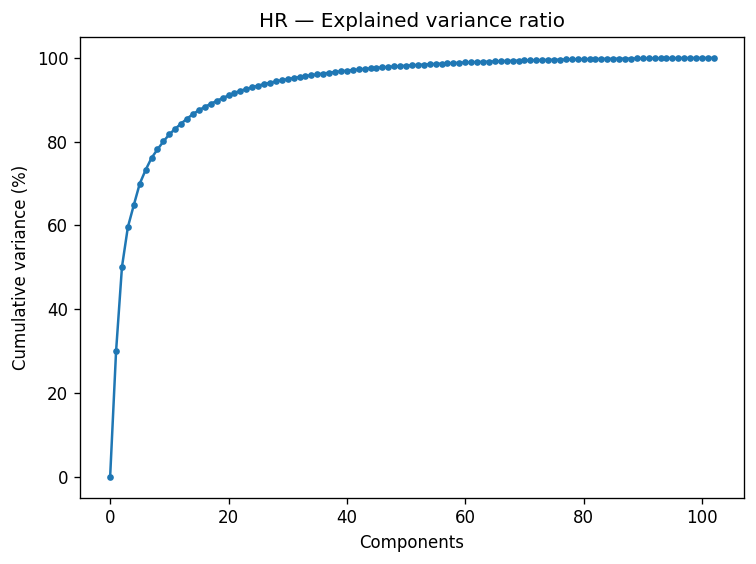

In [48]:
avg_hr = displacements_hr_red.mean(0)
pca_hr = PCA(n_components=min
(graph.n_shapes, 3 * K_DISPLACEMENT))
emb_hr = pca_hr.fit_transform(displacements_hr_red - avg_hr[None, :])

plt.figure(dpi=120)
plt.title("HR — Explained variance ratio")
plt.xlabel("Components"); plt.ylabel("Cumulative variance (%)")
plt.plot(100 * np.cumsum(np.concatenate([[0], pca_hr.explained_variance_ratio_])), marker=".")
plt.tight_layout(); plt.show()

In [49]:
# Visualise top-6 HR deformation modes
for comp_idx in range(6):
    tau = pca_hr.components_[comp_idx].reshape(K_DISPLACEMENT, 3)
    deform = evecs_tmpl_hr[:, :K_DISPLACEMENT] @ tau           # (n_hr, 3)
    scalar = np.linalg.norm(deform, axis=1)
    plot_mesh(mesh_tmpl_hr.vertices, mesh_tmpl_hr.faces, scalar=scalar,
              title=f"HR PCA mode {comp_idx+1}")

### Classification

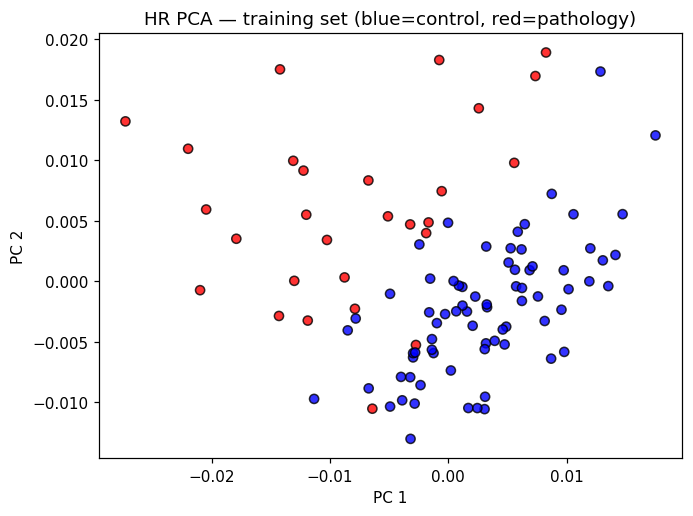

In [50]:
colors = ["blue" if l == 0 else "red" for l in train_labels]
plt.figure(dpi=110)
plt.scatter(emb_hr[:, 0], emb_hr[:, 1], c=colors, edgecolors="k", alpha=0.8)
plt.xlabel("PC 1"); plt.ylabel("PC 2")
plt.title("HR PCA — training set (blue=control, red=pathology)")
plt.tight_layout(); plt.show()

In [51]:
lr_clf = LogisticRegression(penalty="l2", solver="lbfgs", max_iter=1000)
lr_clf.fit(emb_hr, train_labels)
print(f"Logistic regression (train): {lr_clf.score(emb_hr, train_labels):.3f}")

rf_clf = RandomForestClassifier(n_estimators=100, random_state=42,
                                 class_weight={0: 4, 1: 1})
rf_clf.fit(emb_hr, train_labels)
print(f"Random Forest (train): {rf_clf.score(emb_hr, train_labels):.3f}")

svm_clf = svm.SVC(kernel="rbf", C=1, probability=True)
svm_clf.fit(emb_hr[:, :4], train_labels)
print(f"SVM-RBF (train, PC 0-3): {svm_clf.score(emb_hr[:, :4], train_labels):.3f}")

Logistic regression (train): 0.725
Random Forest (train): 1.000
SVM-RBF (train, PC 0-3): 0.961


C:\Users\LONGA\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:1135: FutureWarning:

'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.



### Test Set Evaluation

In [52]:

# Test data is already loaded and preprocessed in cell d0063799 (test_hm_list, test_hr_list).
print(f"Test set: {len(test_hm_list)} meshes")
print(f"  HR vertices: {test_hr_list[0].n_vertices} | LR vertices: {test_hm_list[0].low.n_vertices}")


Test set: 18 meshes
  HR vertices: 8398 | LR vertices: 2997


In [ ]:
# Project test meshes: align at LR, compute LR displacement, upsample to HR
# via scalar_low_high, then project with pinv_evecs.  This mirrors the
# training pipeline (LR quality -> HR resolution) rather than relying on
# noisy HR vertex KNN.
test_disp_red = np.zeros((len(test_hr_list), 3 * K_DISPLACEMENT))

for i, (mesh_hr, hm_test) in enumerate(zip(test_hr_list, test_hm_list)):
    mesh_lr = copy.deepcopy(hm_test.low)
    R_align = align_mesh(mesh_lr.vertices, mesh_tmpl_lr.vertices)
    mesh_lr.vertices[:] = mesh_lr.vertices @ R_align.T

    p2p_lr = knn_query(mesh_tmpl_lr.vertices, mesh_lr.vertices)
    disp_lr = mesh_lr.vertices[p2p_lr] - mesh_tmpl_lr.vertices      # (n_lr, 3)

    # Upsample LR displacement to HR using the template barycentric map
    disp_hr = np.asarray(tmpl_hm.scalar_low_high(disp_lr.T)).T      # (n_hr, 3)
    tau = pinv_evecs @ disp_hr
    test_disp_red[i] = tau.flatten()

test_emb_hr = pca_hr.transform(test_disp_red - avg_hr[None, :])
print("Test embeddings shape:", test_emb_hr.shape)


Test LR embeddings shape: (18, 102)
RF-LR train accuracy: 1.000

Random Forest LR (original pipeline) — Test set
Accuracy: 0.889
              precision    recall  f1-score   support

           0       0.92      0.92      0.92        13
           1       0.80      0.80      0.80         5

    accuracy                           0.89        18
   macro avg       0.86      0.86      0.86        18
weighted avg       0.89      0.89      0.89        18



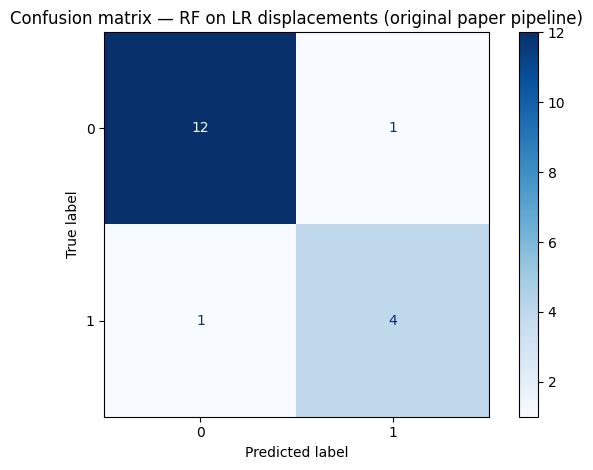

In [55]:
# ── LR Test Displacement — mirrors original paper exactly ───────────────────
# align LR test mesh -> vertex KNN against LR template -> spectral project
# -> pca_lr.transform (no avg subtraction, matching original's pca_d.transform)

mesh_tmpl_lr = graph.shapes[base_meshind].low
displacements_lr_red_test = np.zeros((len(test_hm_list), 3 * K_DISPLACEMENT))

for i, hm_test in enumerate(test_hm_list):
    mesh_lr = hm_test.low
    R_align = align_mesh(mesh_lr.vertices, mesh_tmpl_lr.vertices)
    mesh_lr.vertices[:] = mesh_lr.vertices @ R_align.T

    p2p = knn_query(mesh_tmpl_lr.vertices, mesh_lr.vertices)
    disp_xyz = mesh_lr.vertices[p2p] - mesh_tmpl_lr.vertices
    tau = spectral_project(mesh_tmpl_lr, disp_xyz, K_DISPLACEMENT)
    displacements_lr_red_test[i] = tau.flatten()

# Original does pca_d.transform(test) with no avg subtraction
# (pca_lr.mean_ ~ 0 because training data was already mean-subtracted)
test_emb_lr = pca_lr.transform(displacements_lr_red_test)
print("Test LR embeddings shape:", test_emb_lr.shape)

# Train RF on LR embeddings — matches original paper classifier
rf_lr = RandomForestClassifier(n_estimators=100, random_state=42,
                                class_weight={0: 4, 1: 1})
rf_lr.fit(emb_lr, train_labels)
print(f"RF-LR train accuracy: {rf_lr.score(emb_lr, train_labels):.3f}")

pred_lr = rf_lr.predict(test_emb_lr)
print("\nRandom Forest LR (original pipeline) — Test set")
print(f"Accuracy: {accuracy_score(test_labels, pred_lr):.3f}")
print(classification_report(test_labels, pred_lr, zero_division=0))
cm_lr = confusion_matrix(test_labels, pred_lr)
ConfusionMatrixDisplay(cm_lr).plot(cmap="Blues")
plt.title("Confusion matrix — RF on LR displacements (original paper pipeline)")
plt.tight_layout(); plt.show()
